# Moscow Foodservice industry Analysis

**Context:**
Investors intended to open coffee shop in Moscow. Dataset contents Foodservice places information based on Yandex.Map and Yandex.Business for summer 2022.

**Project goal**: Analyse Moscow Foodservice industry in order to define insights and state recommendations to open a coffee shop.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy import stats as st
from IPython.display import display
import pylab as pl
from datetime import datetime, timedelta
pd.set_option('display.max_colwidth', None) # Отключим усечение ячеек
import plotly.express as px
import math as mth
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Data Processing and Exploration

In [3]:
df = pd.read_csv('/datasets/moscow_places.csv')
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


### Gaps & Duplicates

In [5]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Gaps for columns hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats are detected.

In [6]:
df[(df['avg_bill'].isna() == False) & (df['avg_bill'].str.contains(r'\Средний счёт')) & (df['middle_avg_bill'].isna() == True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [7]:
df[(df['avg_bill'].isna() == False) & (df['avg_bill'].str.contains(r'\Цена одной чашки капучино')) & (df['middle_coffee_cup'].isna() == True)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Gaps for columns middle_avg_bill & middle_coffee_cup could not be filled.

In [8]:
print('Duplicates detected -', df.duplicated().sum())

Duplicates detected - 0


In [9]:
duplicates = df[df.duplicated(['name', 'address'])]
duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [10]:
df ['name'] = df['name'].str.lower()

In [11]:
duplicates_lc = df[df.duplicated(['name', 'address'])]
duplicates_lc

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Duplicates with same name and address detected.
Duplicates  sum 0,01%, thus they could be deleted without serious consequences.

In [12]:
df[['name', 'address']]  = df[['name', 'address']].drop_duplicates()

### Outliers and Abnormal values

In [13]:
df.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Columns middle_avg_bill, middle_coffee_cup & seats should be examined for outliers and abnormal values.

#### middle_avg_bill

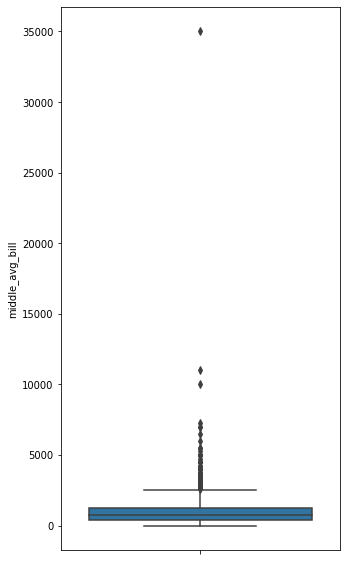

In [14]:
plt.figure(figsize=(5, 10))
sns.boxplot (y = df['middle_avg_bill']);

In [15]:
df_new = df.dropna(subset=['middle_avg_bill'])
middle_avg_bill_percentile = round(np.percentile (df_new.middle_avg_bill, 99))
print('Less than 1% of foodservice places has average check higher than', middle_avg_bill_percentile)

Less than 1% of foodservice places has average check higher than 3750


In [16]:
df_high_price = df[df['middle_avg_bill'] > 3750]
df_high_price.shape[0]

30

In [17]:
df = df.drop(np.where(df['middle_avg_bill']>3750)[0])

In [18]:
df_zero_price = df[df['middle_avg_bill'] == 0]
df_zero_price.shape[0]

1

In [19]:
df = df.drop(np.where(df['middle_avg_bill']== 0)[0])

#### middle_coffee_cup

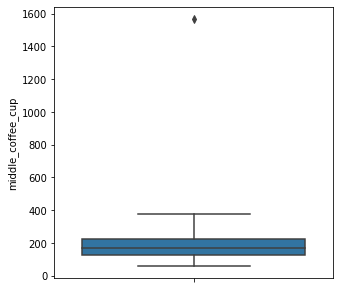

In [20]:
plt.figure(figsize=(5, 5))
sns.boxplot (y = df['middle_coffee_cup']);

1 outlier detected.

In [21]:
df_new = df.dropna(subset=['middle_coffee_cup'])
middle_coffee_cup_percentile = round(np.percentile (df_new.middle_coffee_cup, 99.9))
print(middle_coffee_cup_percentile)

931


In [22]:
df[df ['middle_coffee_cup']>931]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [23]:
shokoladnitsa = df[df['name']=='шоколадница']
shokoladnitsa.avg_bill.unique()

array(['Цена чашки капучино:239–274 ₽', nan, 'Средний счёт:до 650 ₽',
       'Цена чашки капучино:179–249 ₽', 'Цена чашки капучино:285–289 ₽',
       'Средний счёт:1000–1500 ₽', 'Цена чашки капучино:150–290 ₽',
       'Средний счёт:650–850 ₽', 'Средний счёт:700–1000 ₽',
       'Цена чашки капучино:300–350 ₽', 'Цена чашки капучино:249–284 ₽',
       'Средний счёт:400 ₽', 'Средний счёт:650 ₽',
       'Цена чашки капучино:от 170 ₽', 'Цена чашки капучино:250 ₽',
       'Средний счёт:500–1000 ₽', 'Цена чашки капучино:230–2907 ₽',
       'Цена чашки капучино:284–299 ₽', 'Средний счёт:700–1500 ₽',
       'Цена чашки капучино:230–290 ₽', 'Средний счёт:300–500 ₽',
       'Цена чашки капучино:179–314 ₽', 'Средний счёт:600–700 ₽',
       'Средний счёт:300 ₽', 'Цена чашки капучино:179–275 ₽'],
      dtype=object)

In [24]:
df.at [2859, 'avg_bill'] = 'Цена чашки капучино:230–290 ₽'
df.at [2859, 'middle_coffee_cup'] = 260

#### seats

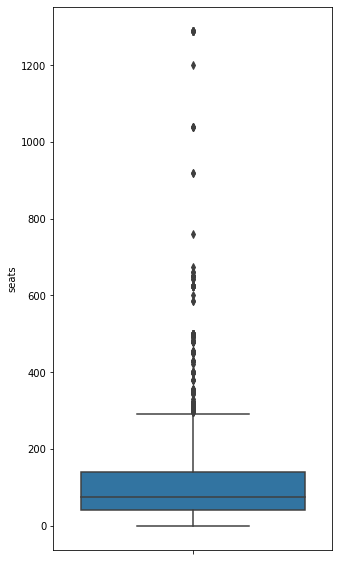

In [25]:
plt.figure(figsize=(5, 10))
sns.boxplot (y = df['seats']);

Several outlies detected.

In [26]:
df_new = df.dropna(subset=['seats'])
seats_percentile = round(np.percentile (df_new.seats, 99))
print('Less than 1% of foodservice places has more than', seats_percentile, 'seats')

Less than 1% of foodservice places has more than 625 seats


In [27]:
to_many_seats = df[df['seats']>625]
to_many_seats.shape[0]

30

In [28]:
df = df.drop(np.where(df['seats'] > 625)[0])

In [29]:
df_no_seats = df[df['seats'] == 0]
df_no_seats.shape[0]

136

Foodservice places with 0 seats detected.

In [30]:
seats_0_pivot = df_no_seats.pivot_table(index ='category', values = 'name', aggfunc = 'count').sort_values(by='name', ascending=False)
seats_0_pivot = seats_0_pivot.rename(columns = {'name':'count'})
seats_0_pivot

,count
category,
кафе,44
кофейня,24
ресторан,20
быстрое питание,18
булочная,11
пиццерия,10
столовая,5
"бар,паб",4


## Data analysis

In [31]:
df['street'] = df['address'].str.split(', ').str[1]

In [32]:
df['is_24/7'] = df['hours'].str.contains(r'\ежедневно, круглосуточно')

In [33]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False


### Categories

In [34]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [35]:
category_pivot = df.pivot_table(index ='category', values = 'name', aggfunc = 'count')
category_pivot = category_pivot.rename(columns = {'name':'count'}).sort_values(by='count', ascending=False)
category_pivot['share'] = round(category_pivot['count']/(category_pivot['count'].sum())*100, 1)

category_pivot = category_pivot.reset_index()
category_pivot

,category,count,share
0,кафе,2364,28.3
1,ресторан,2014,24.1
2,кофейня,1409,16.9
3,"бар,паб",755,9.1
4,пиццерия,629,7.5
5,быстрое питание,601,7.2
6,столовая,314,3.8
7,булочная,256,3.1


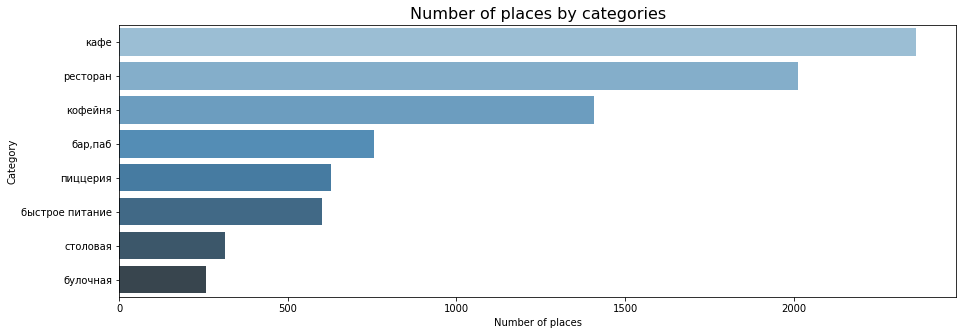

In [36]:
category_pivot = category_pivot.sort_values(by='count', ascending=False)
f, ax = plt.subplots(figsize=(15, 5))

ax = sns.barplot(data = category_pivot, x = 'count', y = 'category', palette = "Blues_d")
ax.set_xlabel('Number of places')
ax.set_ylabel('Category')
ax.set_title('Number of places by categories', fontsize=16)
plt.show()

### Seats

In [37]:
seats_pivot = df.pivot_table(index ='category', values = 'seats', aggfunc = 'mean').sort_values(by='seats')
seats_pivot['seats'] = round(seats_pivot['seats'])
seats_pivot = seats_pivot.reset_index()
seats_pivot

,category,seats
0,булочная,89.0
1,пиццерия,94.0
2,кафе,97.0
3,быстрое питание,99.0
4,столовая,100.0
5,кофейня,111.0
6,ресторан,120.0
7,"бар,паб",125.0


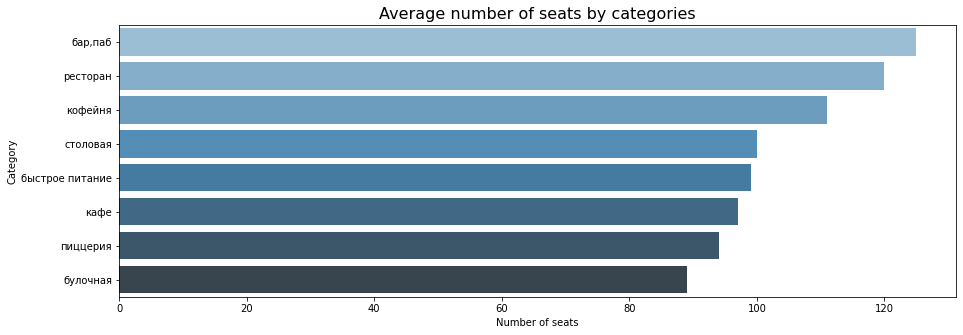

In [38]:
seats_pivot = seats_pivot.sort_values(by='seats', ascending=False)
f, ax = plt.subplots(figsize=(15, 5))

ax = sns.barplot(data = seats_pivot, x = 'seats', y = 'category', palette = "Blues_d")
ax.set_xlabel('Number of seats')
ax.set_ylabel('Category')
ax.set_title('Average number of seats by categories', fontsize=16)
plt.show()

### Chain and non-chain places

In [39]:
chain_pivot = df.pivot_table(index ='chain', values = 'name', aggfunc = 'count')
chain_pivot['share'] = round(chain_pivot['name']/(chain_pivot['name'].sum())*100, 1)
chain_pivot = chain_pivot.rename(columns = {'name':'count'})
chain_pivot

,count,share
chain,,
0,5152,61.8
1,3190,38.2


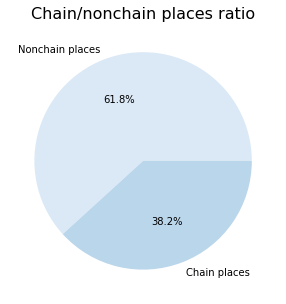

In [40]:
plt.figure(figsize=(10, 5))
labels = ["Nonchain places", "Chain places"]
chain_pivot['count'].plot(kind='pie', autopct='%1.1f%%', labels=labels, colors=sns.color_palette("Blues"))
plt.title("Chain/nonchain places ratio", fontsize=16 )
plt.ylabel("")
plt.show()

In [41]:
category_chain_pivot = df.pivot_table (index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
category_chain_pivot.columns = ['solo', 'chain']
category_chain_pivot['share_solo'] = round(category_chain_pivot['solo']/(category_chain_pivot['solo']+category_chain_pivot['chain'])*100, 1)
category_chain_pivot['share_chain'] = round(category_chain_pivot['chain']/(category_chain_pivot['solo']+category_chain_pivot['chain'])*100, 1)
category_chain_pivot = category_chain_pivot.drop (columns = ['solo', 'chain'])
category_chain_pivot_sorted=category_chain_pivot.sort_values(by='share_solo', ascending=False)
category_chain_pivot_sorted

,share_solo,share_chain
category,,
"бар,паб",77.9,22.1
столовая,72.0,28.0
кафе,67.1,32.9
ресторан,64.1,35.9
быстрое питание,61.6,38.4
кофейня,49.1,50.9
пиццерия,47.7,52.3
булочная,38.7,61.3


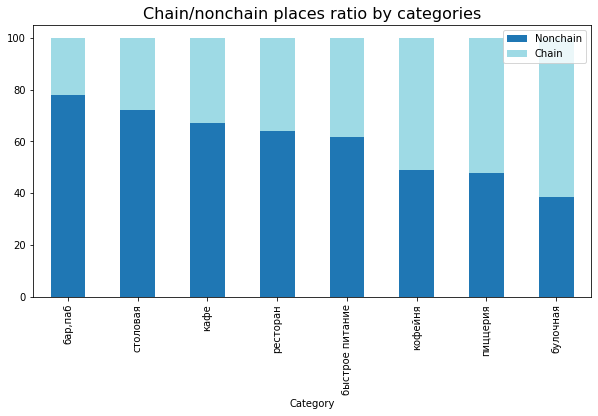

In [42]:
category_chain_pivot_sorted.plot(kind = 'bar', stacked = True, figsize = (10, 5), colormap = 'tab20')
plt.title("Chain/nonchain places ratio by categories", fontsize=16 )
plt.xlabel("Category")
plt.legend(["Nonchain", "Chain"])
plt.show()

### Top-15 most popular places

In [43]:
df_chain = df.query('chain == 1')
top_chain_pivot = df_chain.pivot_table(index = ['name','category'], values = 'address', aggfunc = 'count').sort_values(by='address', ascending=False).head(15)
top_chain_pivot = top_chain_pivot.rename(columns = {'address':'count'})
top_chain_pivot = top_chain_pivot.reset_index()
top_chain_pivot

,name,category,count
0,шоколадница,кофейня,118
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,68
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,35


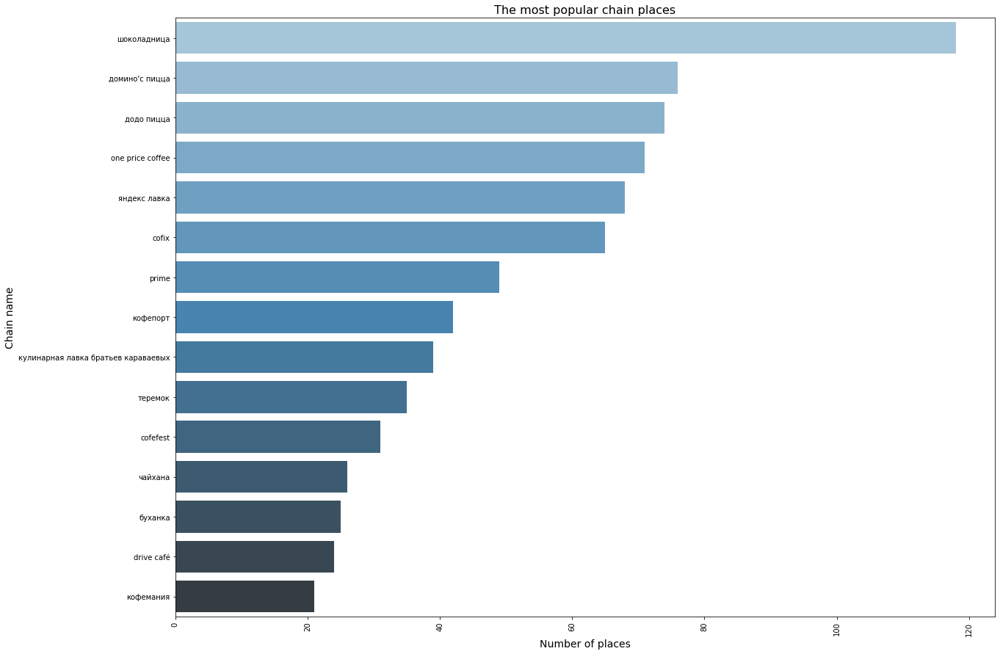

In [44]:
top_chain_pivot = top_chain_pivot.sort_values(by='count', ascending=False)
f, ax = plt.subplots(figsize=(20, 15))

ax = sns.barplot(data = top_chain_pivot, x = 'count', y ='name', palette = "Blues_d" )
ax.set_xlabel('Number of places', fontsize=14)
ax.set_ylabel('Chain name', fontsize=14)
ax.set_title('The most popular chain places', fontsize=16)
plt.xticks(rotation=90)
plt.show()

In [45]:
top_chain_category_pivot = top_chain_pivot.pivot_table(index = 'category', values = 'count', aggfunc = 'count').sort_values(by='count', ascending=False)
top_chain_category_pivot = top_chain_category_pivot.reset_index()
top_chain_category_pivot

,category,count
0,кофейня,6
1,кафе,3
2,ресторан,3
3,пиццерия,2
4,булочная,1


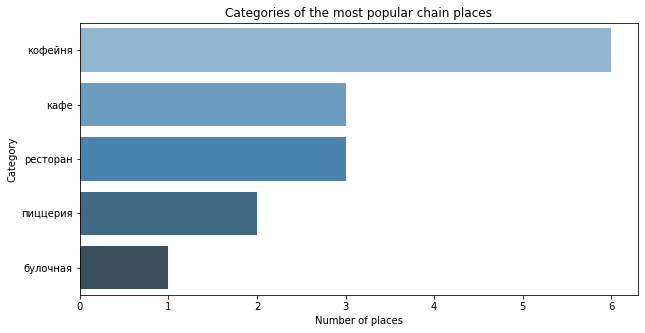

In [46]:
top_chain_category_pivot = top_chain_category_pivot.sort_values(by='count', ascending=False)
f, ax = plt.subplots(figsize=(10, 5))

ax = sns.barplot(data = top_chain_category_pivot, x = 'count', y = 'category', palette = "Blues_d")
ax.set_xlabel('Number of places')
ax.set_ylabel('Category')
ax.set_title('Categories of the most popular chain places')

plt.show()

### Administrative areas

In [47]:
district_pivot = df.pivot_table(index = 'district', columns = 'category', values = 'address', aggfunc = 'count')
district_pivot ['total'] = district_pivot[[
    'бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
district_pivot = district_pivot.sort_values(by='total', ascending=False)
district_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,360,50,87,464,426,113,652,65,2217
Северный административный округ,67,39,58,235,193,77,186,41,896
Южный административный округ,68,25,85,263,131,73,201,44,890
Северо-Восточный административный округ,62,28,82,268,159,68,182,40,889
Западный административный округ,48,37,61,235,148,71,212,24,836
Восточный административный округ,52,25,70,268,105,70,159,40,789
Юго-Восточный административный округ,38,13,67,280,89,55,145,25,712
Юго-Западный административный округ,37,27,61,236,96,62,168,17,704
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


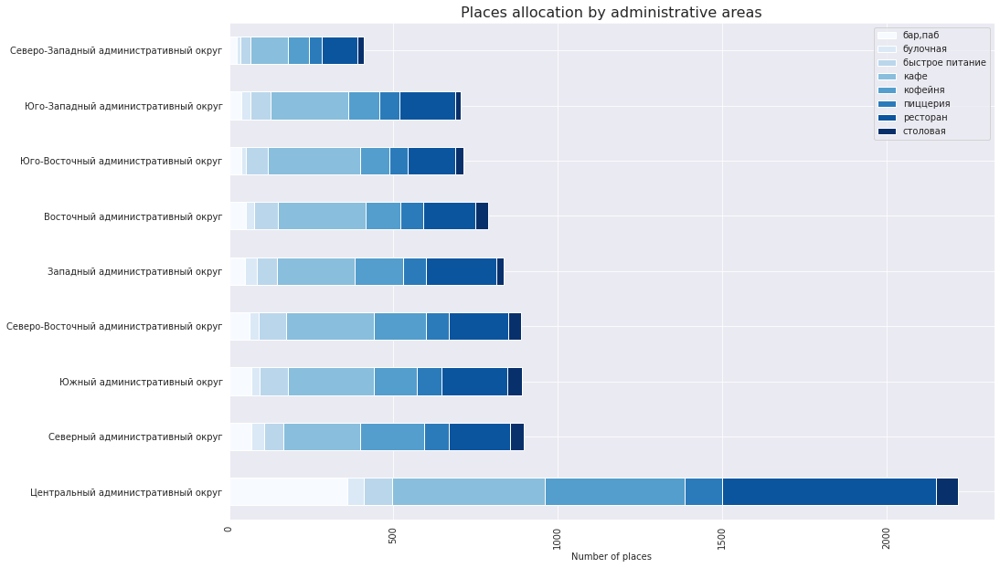

In [48]:
district_pivot = district_pivot.drop (columns = ['total'])
sns.set_style('darkgrid')
district_pivot.plot(kind = 'barh', stacked = True, figsize = (15,10), colormap = 'Blues')
plt.title("Places allocation by administrative areas", fontsize=16 )
plt.xlabel("Number of places")
plt.ylabel("")
plt.legend(["бар,паб", "булочная", "быстрое питание", "кафе", "кофейня", "пиццерия", "ресторан", "столовая"])
plt.xticks(rotation=90)
plt.show()

### Raitings by categories

In [49]:
rating_pivot = df.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean')
rating_pivot['rating'] = round(rating_pivot['rating'], 2)
rating_pivot = rating_pivot.sort_values(by='rating', ascending=False).reset_index()
rating_pivot

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.13
7,быстрое питание,4.05


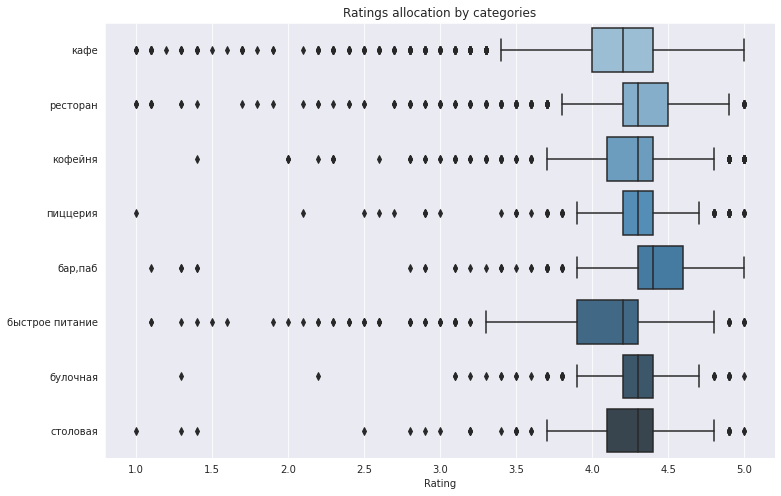

In [50]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df, y = 'category', x = 'rating', palette = "Blues_d")
plt.xlabel('Rating')
plt.ylabel('')
plt.title('Ratings allocation by categories')
plt.show();

### Ratings by administrative areas

In [51]:
rating_district_pivot = df.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean')
rating_district_pivot['rating'] = round(rating_district_pivot['rating'], 2)
rating_district_pivot = rating_district_pivot.sort_values(by='rating', ascending=False).reset_index()
rating_district_pivot

,district,rating
0,Центральный административный округ,4.37
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [52]:
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_districts,
    data=rating_district_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Ratings by administrative areas',
).add_to(m1)

display (m1)

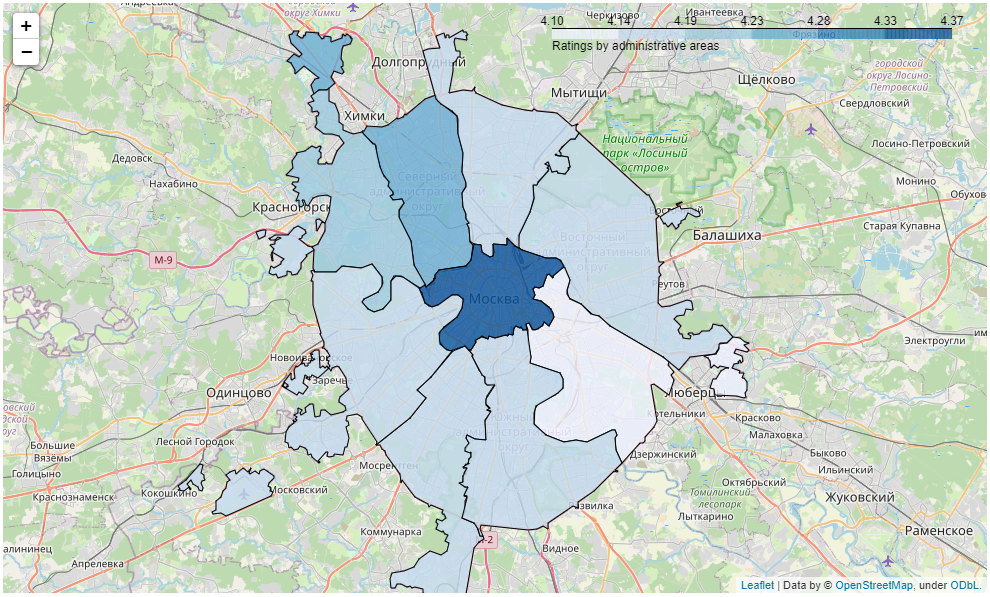

### Clusters

In [53]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
df.apply(create_clusters, axis=1)
m

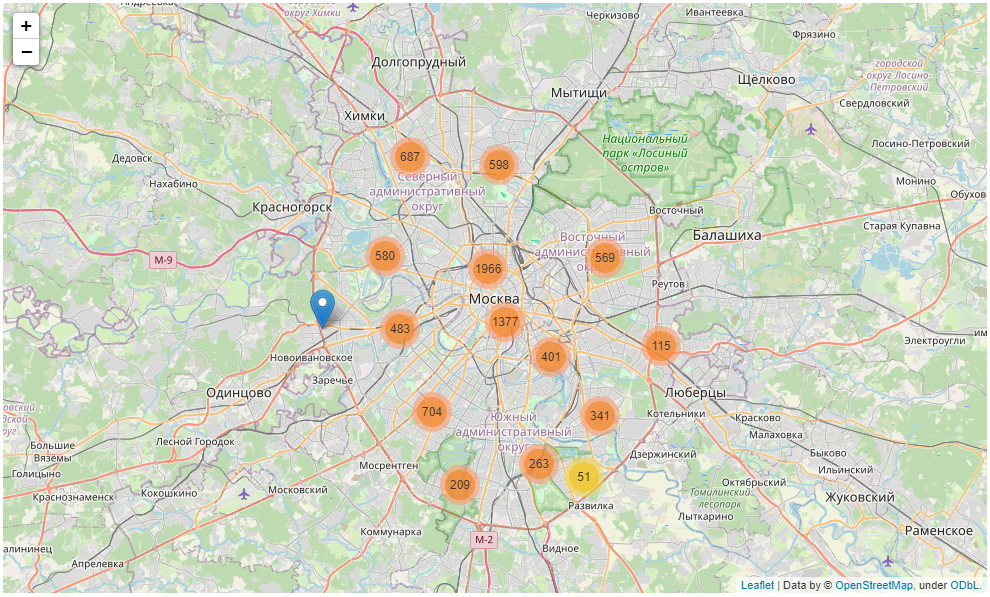

### Popular streets

In [54]:
street_pivot = df.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count')
street_pivot ['total'] = street_pivot[["бар,паб", "булочная", "быстрое питание", "кафе", "кофейня", "пиццерия", "ресторан", "столовая"]].sum(axis=1)
street_pivot = street_pivot.sort_values(by='total', ascending = False).head (15)
street_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект Мира,11.0,4.0,21.0,52.0,36.0,11.0,45.0,2.0,182.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
Ленинский проспект,8.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,105.0
проспект Вернадского,7.0,1.0,11.0,24.0,16.0,12.0,30.0,2.0,103.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,24.0,3.0,94.0
Дмитровское шоссе,5.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,87.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0,76.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0,69.0


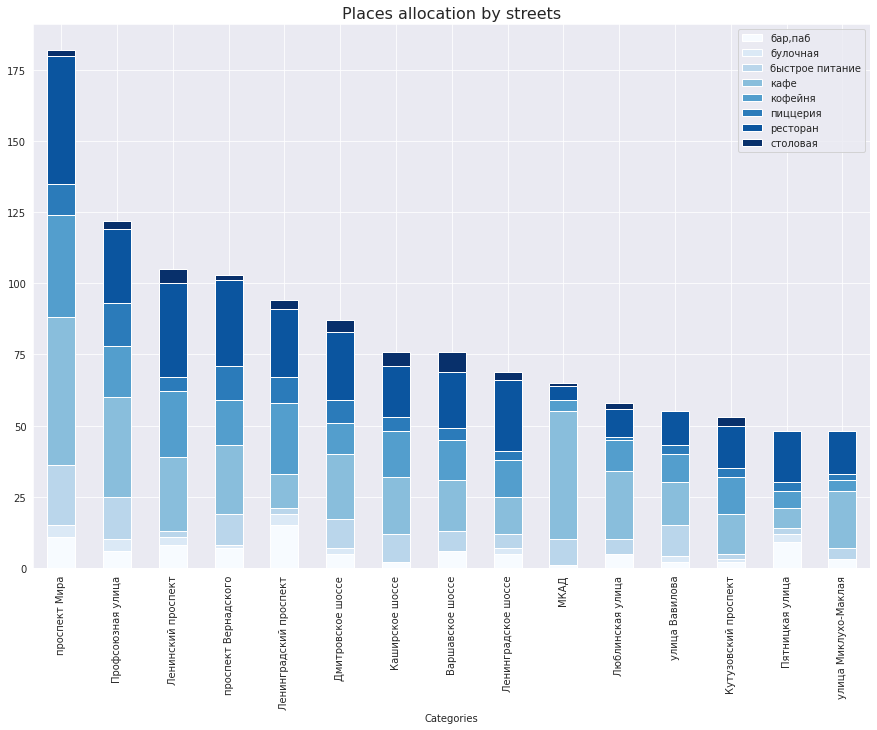

In [55]:
street_pivot = street_pivot.drop (columns = ['total'])
sns.set_style('darkgrid')
street_pivot.plot(kind = 'bar', stacked = True, figsize = (15,10),  colormap = 'Blues')
plt.title("Places allocation by streets", fontsize=16 )
plt.xlabel("Categories")
plt.legend(["бар,паб", "булочная", "быстрое питание", "кафе", "кофейня", "пиццерия", "ресторан", "столовая"])
plt.xticks(rotation=90)
plt.show()

### Non-popular streets

In [56]:
notpop_street_pivot = df.pivot_table(index = 'street', values = 'name', aggfunc = 'count')
notpop_street_pivot = notpop_street_pivot.query('name == 1').reset_index()
notpop_street_pivot

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
4,1-й Голутвинский переулок,1
...,...,...
451,улица Шкулёва,1
452,улица Шкулёва 4,1
453,улица Шухова,1
454,улица Юннатов,1


In [57]:
notpop_street = notpop_street_pivot['street'].tolist()
df_notpop_street = df.query ('street in @notpop_street')[['name','category', 'chain']]
category_notpop_street_pivot = df_notpop_street.pivot_table(index = 'category', values = 'chain', aggfunc = ['count','sum'])
category_notpop_street_pivot.columns = ['count', 'chain']
category_notpop_street_pivot = category_notpop_street_pivot.sort_values(by='count', ascending = False).reset_index()
category_notpop_street_pivot

,category,count,chain
0,кафе,160,44
1,ресторан,90,22
2,кофейня,85,33
3,"бар,паб",38,6
4,столовая,37,9
5,быстрое питание,23,8
6,пиццерия,14,9
7,булочная,9,5


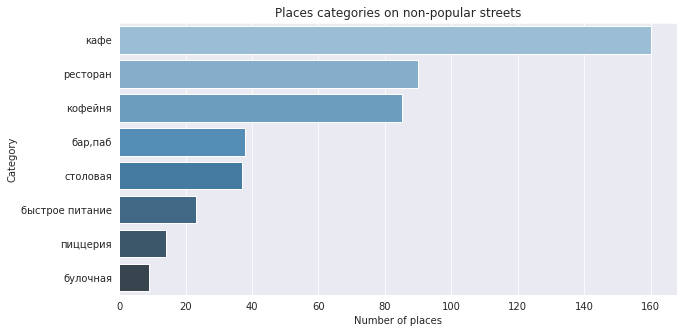

In [58]:
category_notpop_street_pivot = category_notpop_street_pivot.sort_values(by='count', ascending=False)
f, ax = plt.subplots(figsize=(10, 5))
ax = sns.barplot(data = category_notpop_street_pivot, x = 'count', y = 'category', palette = "Blues_d")
ax.set_xlabel('Number of places')
ax.set_ylabel('Category')
ax.set_title('Places categories on non-popular streets')
plt.show()

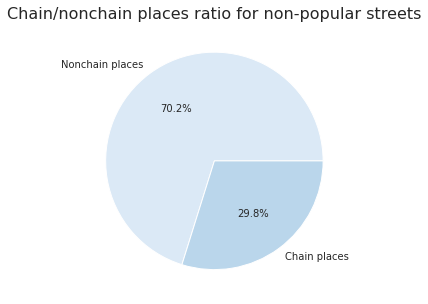

In [59]:
chain_notpop_street_pivot = df_notpop_street.pivot_table(index = 'chain', values = 'name', aggfunc = 'count')
chain_notpop_street_pivot
plt.figure(figsize=(10, 5))
labels = ["Nonchain places", "Chain places"]
chain_notpop_street_pivot['name'].plot(kind='pie', autopct='%1.1f%%', labels=labels, colors=sns.color_palette("Blues"))
plt.title("Chain/nonchain places ratio for non-popular streets", fontsize=16 )
plt.ylabel("")
plt.show()

### Price range for administrative area

In [60]:
bill_district_pivot = df.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median').sort_values(by='middle_avg_bill', ascending = False).reset_index()
bill_district_pivot

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,550.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [61]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_districts,
    data=bill_district_pivot,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Median check by administrative areas',
).add_to(m2)

display (m2)

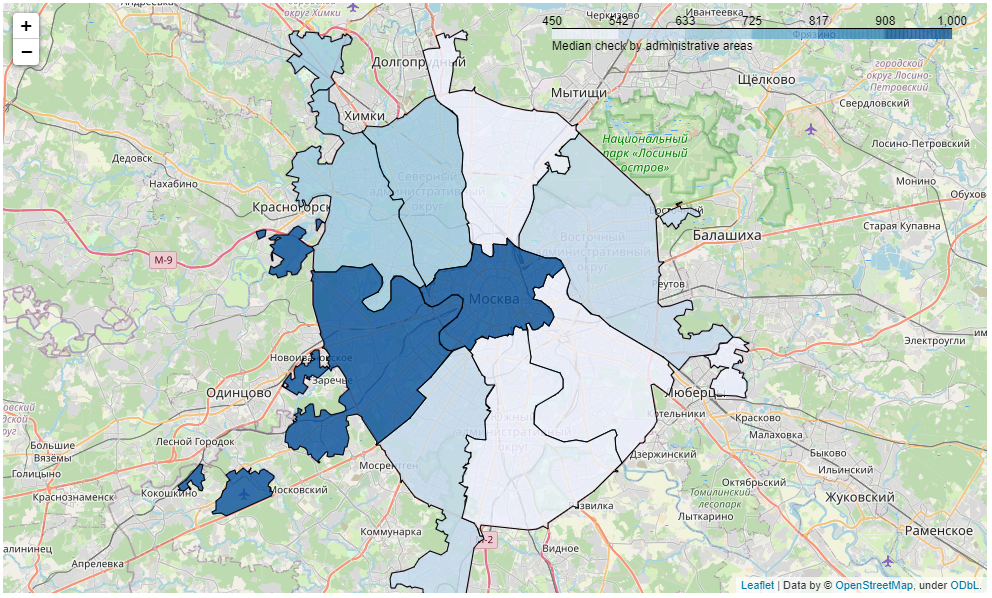

### Analysis conclusion

1.	Categories of places presented in dataset: bar, pub, bakery, fast food, cafe, coffee shop, pizza place, restaurant, dining place.\
It needs to be considered that those kinds of categories seem to be relative nowadays.
2. The most popular categories are: cafe, restaurant, coffee shop, the least popular - dining place and bakery.
3.  More than 60% of places are non-chain.
4. The most popular chains are: шоколадница,  домино'с пицца,  додо пицца, one price coffee,  яндекс лавка,  cofix, prime,  кофепорт, кулинарная лавка братьев караваевых,  теремок,  cofefest, , буханка, drive café и кофемания.\
Among the most popular chains the most popular categories are coffee shops, cafes, the least one - bakeries.
4. Majority of places are situated in the Central area, followed by Northern area, Southern area, North-Eastern area.\
Minority of places are situated in the North-Western area.
The Central area is the absolute top performer by the number of places.
5. Ratings vary by categories. The highest ratings have bars and pubs, the lowest - fast food places.
6. The most popular streets are: проспект Мира, Профсоюзная улица, Ленинский проспект, проспект Вернадского, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, Пятницкая улица и улица Миклухо-Маклая.\
7. 456 streets that have more than one foodservice place are presented in the dataset. Most popular are cafes, the least popular - bakeries.
8. The highest average check places are situated in Central and Western areas. The lowest average check places are situated in the South-Eastern area.

## Coffee shop opening exploration

In [62]:
df_coffee = df[df['category']=='кофейня']
print ('Number of cofffe shops in dataset -', df_coffee['name'].count())

Number of cofffe shops in dataset - 1409


In [63]:
coffee_pivot = df_coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').sort_values(by='name', ascending = False).reset_index()
coffee_pivot

,district,name
0,Центральный административный округ,426
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,148
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


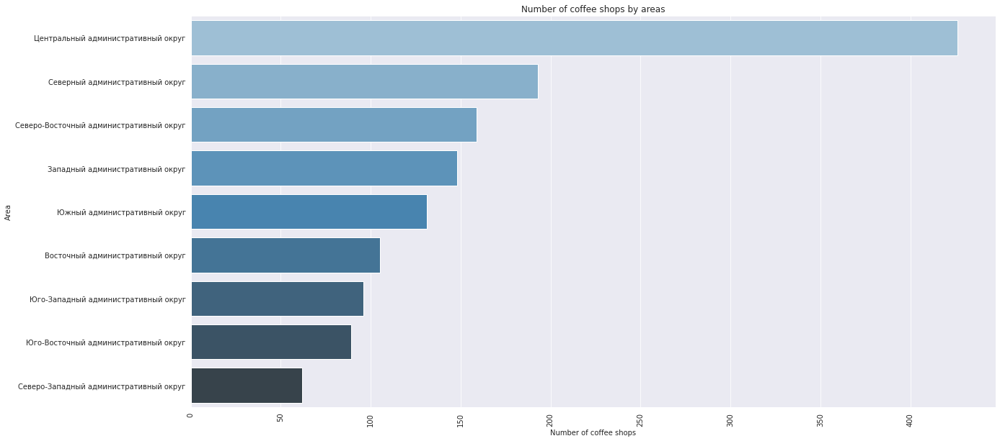

In [64]:
coffee_pivot = coffee_pivot.sort_values(by='name', ascending=False)
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data = coffee_pivot, x = 'name', y = 'district', palette = "Blues_d")
ax.set_xlabel('Number of coffee shops')
ax.set_ylabel('Area')
ax.set_title('Number of coffee shops by areas')
plt.xticks(rotation=90)
plt.show()

In [65]:
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_districts,
    data=coffee_pivot,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Coffeу shops by areas',
).add_to(m3)
display (m3)

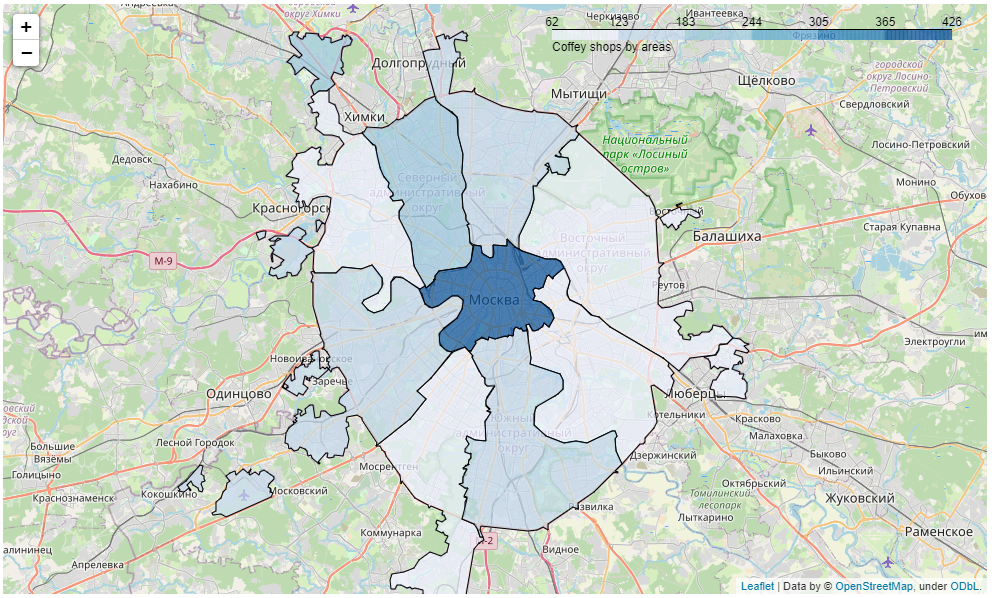

In [66]:
print ('Number of 24/7 coffee shops in dataset - ',df_coffee[df_coffee['is_24/7']==True]['name'].count())

Number of 24/7 coffee shops in dataset -  59


In [67]:
coffee_time_pivot = df_coffee.pivot_table(index = 'is_24/7', values = 'name', aggfunc = 'count').sort_values(by='name', ascending = False).reset_index()
coffee_time_pivot

,is_24/7,name
0,False,1335
1,True,59


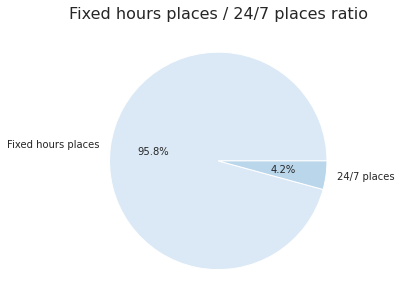

In [68]:
plt.figure(figsize=(10, 5))
labels = ["Fixed hours places", "24/7 places"]
coffee_time_pivot['name'].plot(kind='pie', autopct='%1.1f%%', labels=labels, colors=sns.color_palette("Blues"))
plt.title("Fixed hours places / 24/7 places ratio", fontsize=16 )
plt.ylabel("")
plt.show()

In [69]:
coffee_rating_pivot = df_coffee.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').sort_values(by='rating', ascending = False).reset_index()
coffee_rating_pivot['rating'] = round(coffee_rating_pivot['rating'], 2)
coffee_rating_pivot

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.19


In [70]:
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_districts,
    data=coffee_rating_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Coffee shop rating by areas',
).add_to(m4)
display (m4)

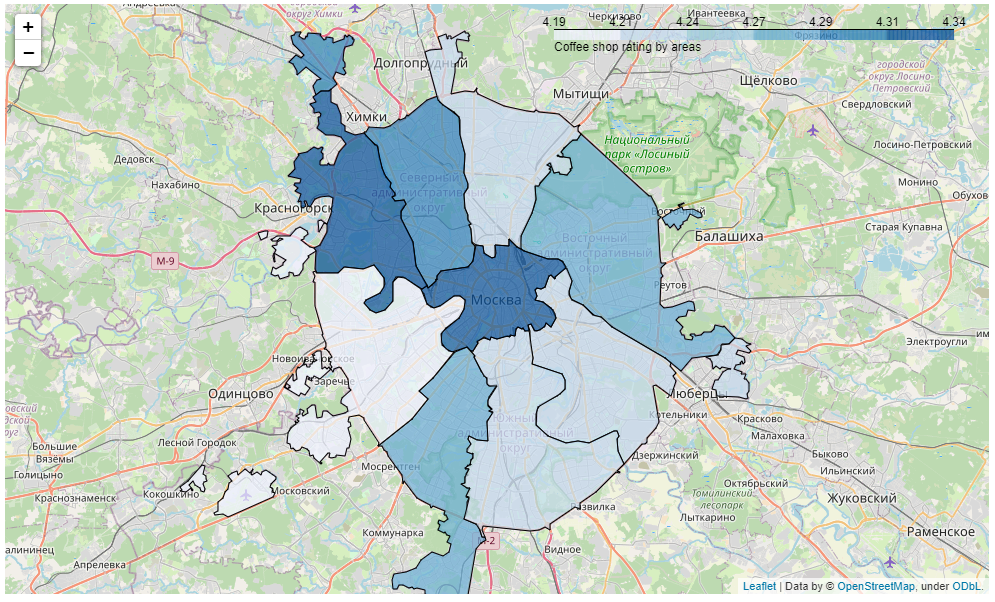

In [71]:
coffee_price_pivot = df_coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = 'mean').sort_values(by='middle_coffee_cup', ascending = False).reset_index()
coffee_price_pivot['middle_coffee_cup'] = round(coffee_price_pivot['middle_coffee_cup'], 2)
coffee_price_pivot

,district,middle_coffee_cup
0,Западный административный округ,188.64
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
5,Северо-Восточный административный округ,165.33
6,Южный административный округ,158.49
7,Юго-Восточный административный округ,151.09
8,Восточный административный округ,142.88


In [72]:
print ('Average price for cup of coffee - ',round(df['middle_coffee_cup'].mean()))

Average price for cup of coffee -  172


In [73]:
moscow_districts = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=moscow_districts,
    data=coffee_price_pivot,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Price for cup of coffee by areas',
).add_to(m4)
display (m4)

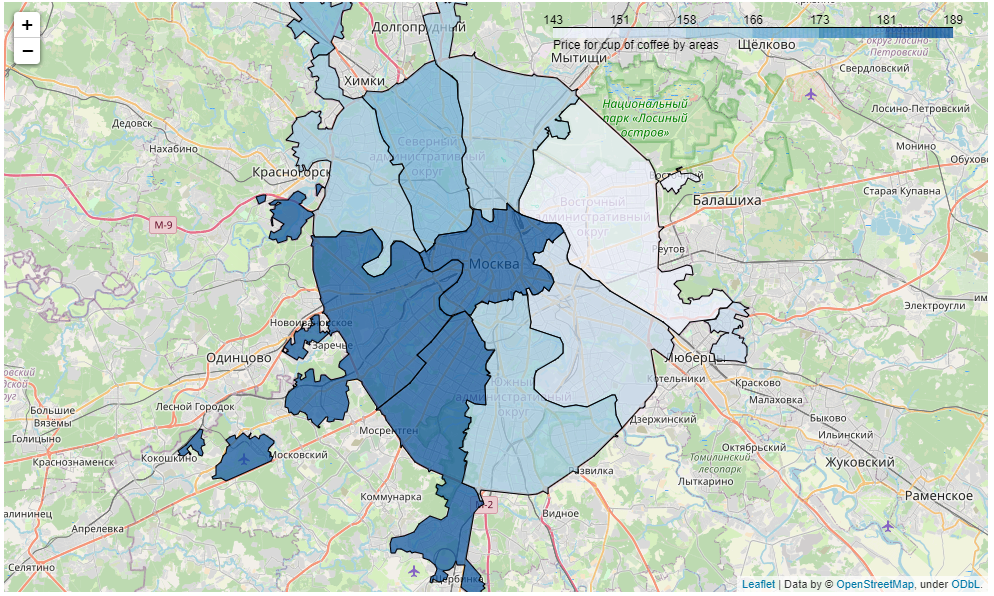

**Recommendations based on exploration:**

1. Central area should not be considered as a good place to open a new coffee shop since despite the high passability, the competition and rent are relatively too high.


2. 24/7 opening hours should not be considered for the coffee shop, but morning hours seem to be crucial.


3. The following areas should be considered:
 - Western area, since the price for a cup of coffee is the highest here, but at the same time average rating seems to be the lowest among all areas. Thus opening the coffee shop in this area the price for a cup of coffee should be set at 180 and pay attention to drinks and service quality.
 - South-Western area, since the price for a cup of coffee is relatively high, the share of coffee shop is just 13%. The main advantage could be the price of coffee cup - close to average (175), which should be less than average for the area.
  

4. Location should be near to the subway, big transport hubs and business centers.
